# Visual data analysis. Part 1. Visualization: from Simple Distributions to Dimensionality Reduction

In [89]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

In [90]:
DATA_URL = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/"

In [91]:
df = pd.read_csv(DATA_URL + "telecom_churn.csv")

In [92]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


## 2.1 Quantitative features

### Histograms and density plots

array([[<Axes: title={'center': 'Total day minutes'}>,
        <Axes: title={'center': 'Total intl calls'}>]], dtype=object)

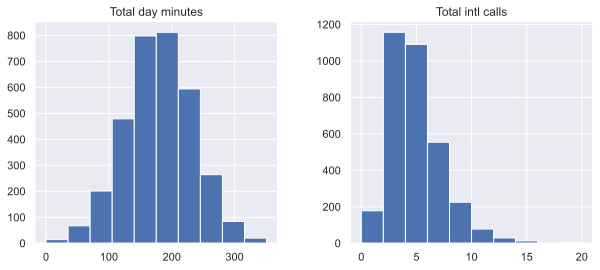

In [93]:
features = ["Total day minutes", "Total intl calls"]
df[features].hist(figsize=(10, 4))

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>]], dtype=object)

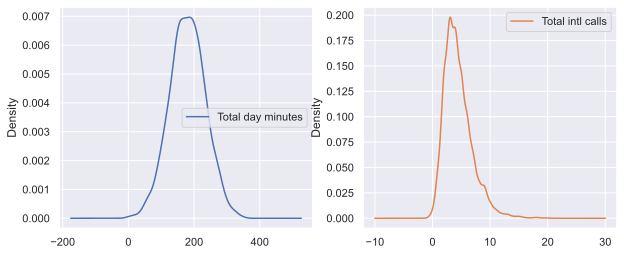

In [94]:
df[features].plot(kind='density', subplots=True, layout=(1,2), sharex=False, figsize=(10,4))

<Axes: xlabel='Total intl calls', ylabel='Density'>

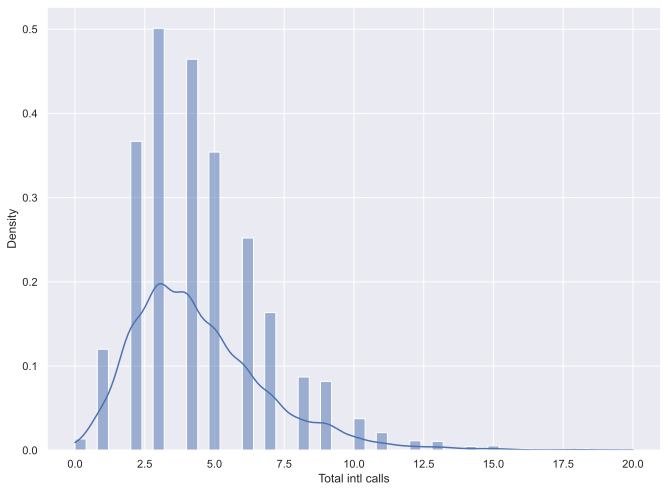

In [95]:
sns.histplot(data=df["Total intl calls"], kde=True, stat='density')

##### Высота столбцов гистограммы здесь нормирована и показывает плотность, а не количество примеров в каждом бине.

### Box plot

<Axes: xlabel='Total intl calls'>

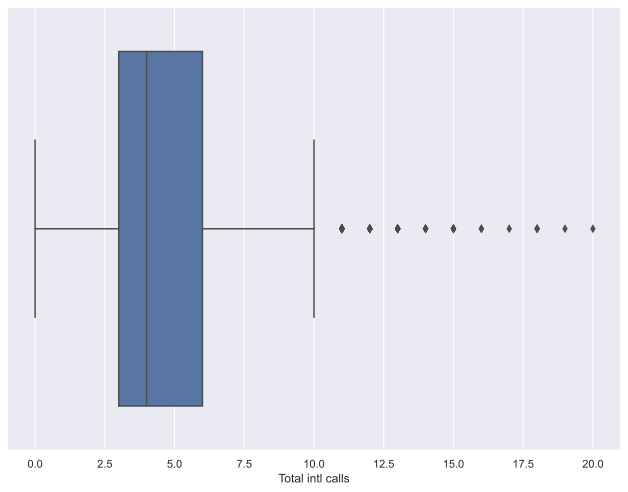

In [96]:
sns.boxplot(data=df, x='Total intl calls')

##### Вертикальная линия внутри коробки обозначает медиану (50 %) распределения.

### Violin plot

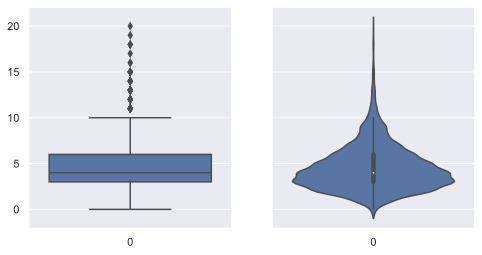

In [97]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(8, 4))
sns.boxplot(data=df["Total intl calls"], ax=axes[0])
sns.violinplot(data=df["Total intl calls"], ax=axes[1]);

##### Разница между бокс- и скрипичными графиками заключается в том, что первый иллюстрирует определенные статистические данные, касающиеся отдельных примеров в наборе данных, в то время как скрипичный график больше концентрируется на сглаженном распределении в целом.



In [98]:
df[features].describe()

,Total day minutes,Total intl calls
count,3333.000000,3333.000000
mean,179.775098,4.479448
std,54.467389,2.461214
min,0.000000,0.000000
25%,143.700000,3.000000
50%,179.400000,4.000000
75%,216.400000,6.000000
max,350.800000,20.000000


## 2.2 Categorical and binary features

Посмотрим на распределение целевого класса – оттока клиентов.

In [99]:
df["Churn"].value_counts()

Churn
False    2850
True      483
Name: count, dtype: int64

In [100]:
df["Churn"].value_counts(normalize=True)

Churn
False    0.855086
True     0.144914
Name: proportion, dtype: float64

### Bar plot

<Axes: xlabel='Customer service calls', ylabel='count'>

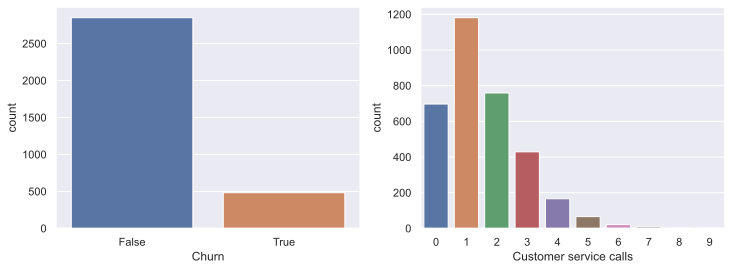

In [101]:
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))
sns.countplot(data=df, x='Churn', ax=axes[0])
sns.countplot(data=df, x='Customer service calls', ax=axes[1])

In [102]:
axes[0]

<Axes: xlabel='Churn', ylabel='count'>

In [103]:
axes[1]

<Axes: xlabel='Customer service calls', ylabel='count'>

Выделим следующие группы признаков (среди всех кроме Churn ):


1) бинарные: International plan, Voice mail plan
2) категориальные: State
3) порядковые: Customer service calls
4) количественные: все остальные


## 3.1 Quantitative vs. Quantitative

### Correlation matrix

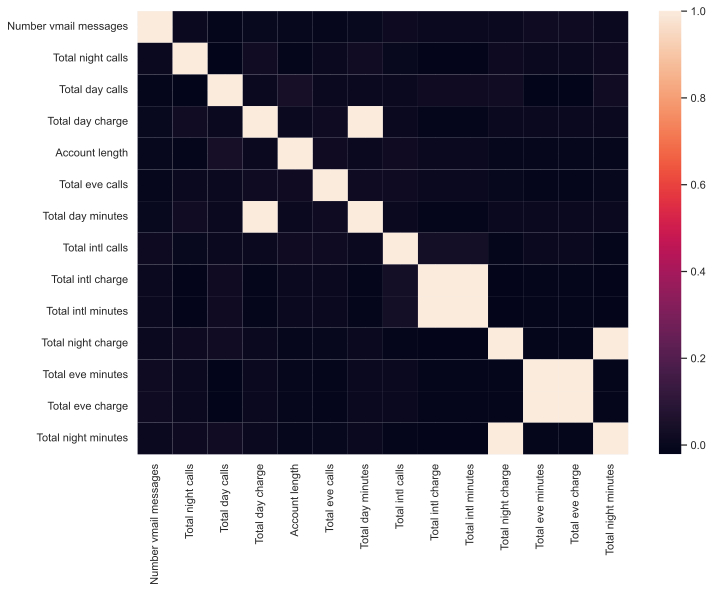

In [104]:
list_non_numerical = ["State", "International plan", "Voice mail plan", "Area code", "Churn", "Customer service calls",]

# Drop non-numerical variables
numerical = list(set(df.columns) - set(list_non_numerical))

# Calculate and plot
corr_matrix = df[numerical].corr()
sns.heatmap(corr_matrix);

In [105]:
# избавляемся от переменных с полной корреляцией
get_rid_list = ["Total day charge", "Total eve charge", "Total night charge", "Total intl charge",]
numerical = list(set(numerical) - set(get_rid_list))

<Axes: >

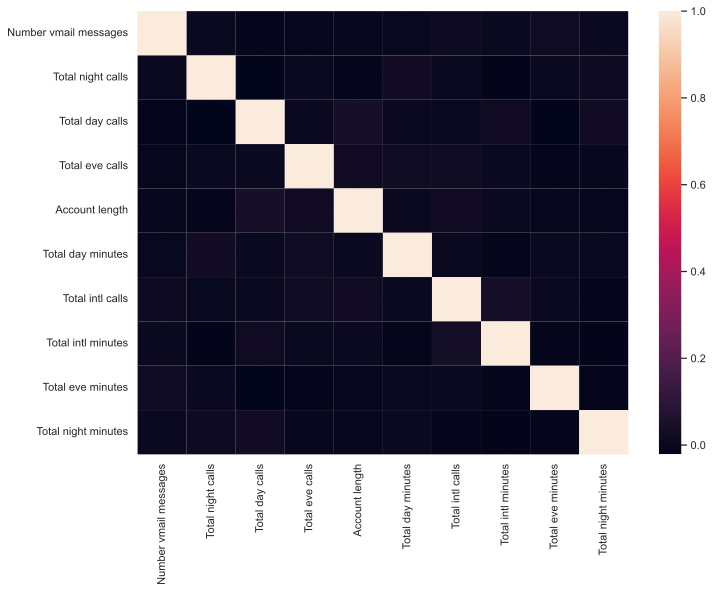

In [106]:
corr_matrix = df[numerical].corr()
sns.heatmap(corr_matrix)

### Scatter plot (диаграмма рассеяния)

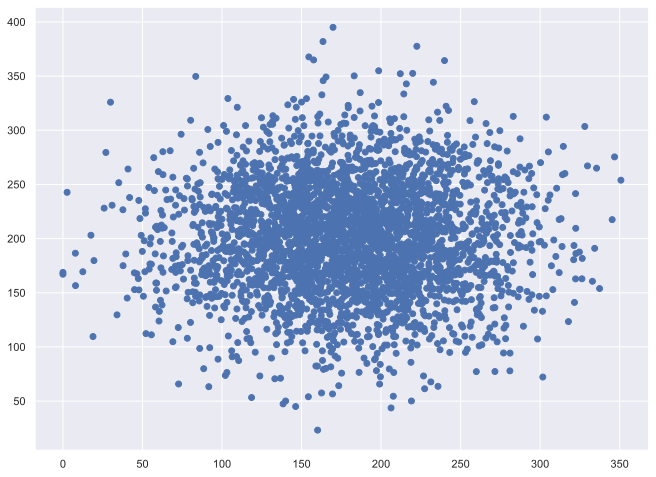

In [107]:
plt.scatter(df["Total day minutes"], df["Total night minutes"])

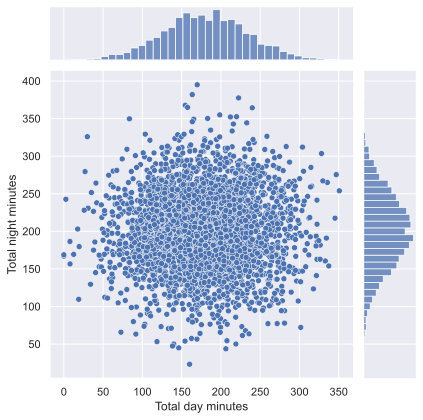

In [108]:
sns.jointplot(data=df, x="Total day minutes", y="Total night minutes", kind='scatter')

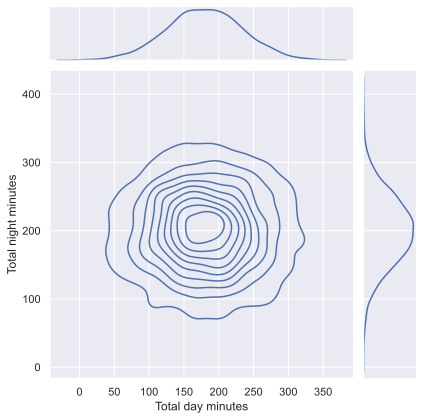

In [109]:
sns.jointplot(data=df, x="Total day minutes", y="Total night minutes", kind='kde', color='b')

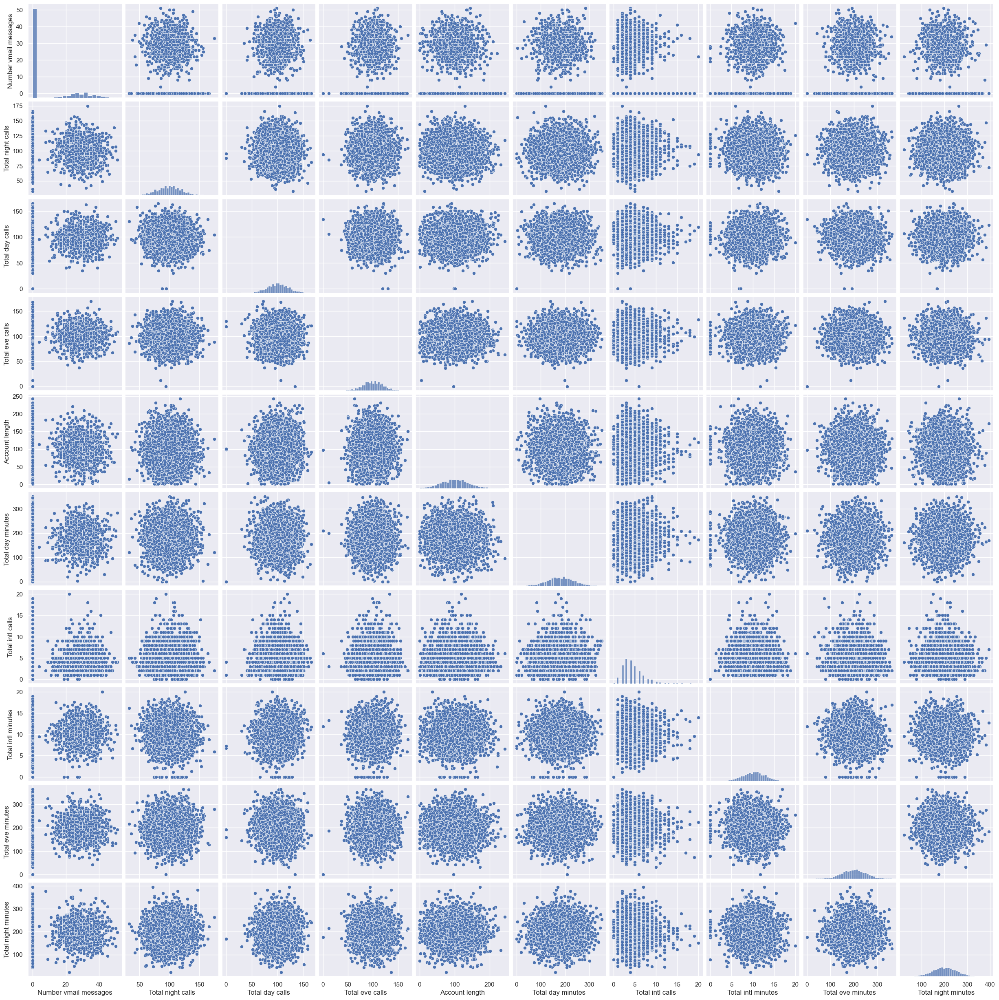

In [110]:
# `pairplot()` may become very slow with the SVG format
%config InlineBackend.figure_format = 'png'

sns.pairplot(df[numerical])

In [111]:
%config InlineBackend.figure_format = 'svg'

## 3.2 Quantitative vs. Categorical

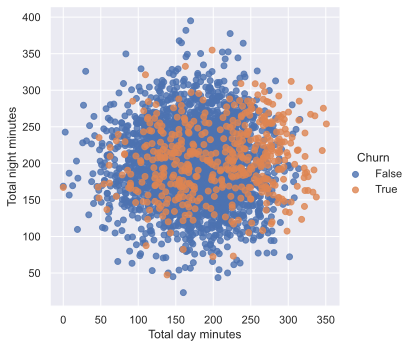

In [112]:
sns.lmplot(data=df, x="Total day minutes", y="Total night minutes", hue="Churn", fit_reg=False)

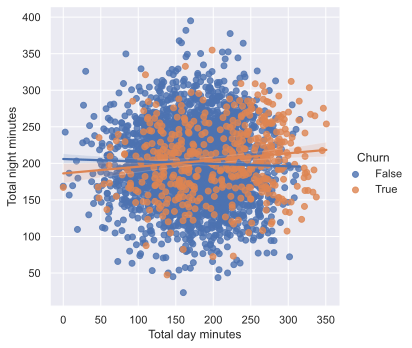

In [113]:
sns.lmplot(data=df, x="Total day minutes", y="Total night minutes", hue="Churn", fit_reg=True)

Построим boxplot-ы, описывающее статистики распределения количественных признаков в двух группах: среди лояльных и ушедших клиентов.

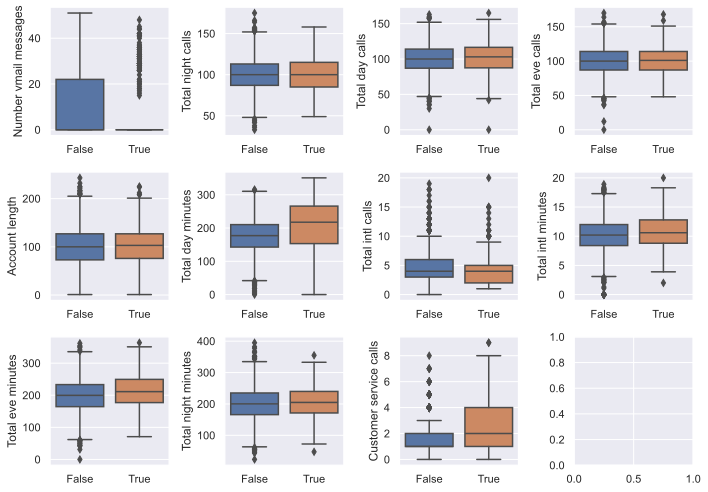

In [114]:
# Sometimes you can analyze an ordinal variable just as numerical one
numerical.append("Customer service calls")

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(10, 7))
for idx, feat in enumerate(numerical):
    ax = axes[int(idx / 4), idx % 4]
    sns.boxplot(x="Churn", y=feat, data=df, ax=ax)
    ax.set_xlabel("")
    ax.set_ylabel(feat)
fig.tight_layout();

На глаз наибольшее отличие мы видим для признаков Total day minutes, Customer service calls и Number vmail messages. Впоследствии мы научимся определять важность признаков в задаче классификации с помощью случайного леса (или градиентного бустинга), и окажется, что первые два – действительно очень важные признаки для прогнозирования оттока.


Посмотрим отдельно на картинки с распределением кол-ва проговоренных днем минут среди лояльных/ушедших. Слева — знакомые нам боксплоты, справа – сглаженные гистограммы распределения числового признака в двух группах (скорее просто красивая картинка, все и так понятно по боксплоту).


Интересное наблюдение: в среднем ушедшие клиенты больше пользуются связью. Возможно, они недовольны тарифами, и одной из мер борьбы с оттоком будет понижение тарифных ставок (стоимости мобильной связи). Но это уже компании надо будет проводить дополнительный экономический анализ, действительно ли такие меры будут оправданы.

<Axes: xlabel='Churn', ylabel='Total day minutes'>

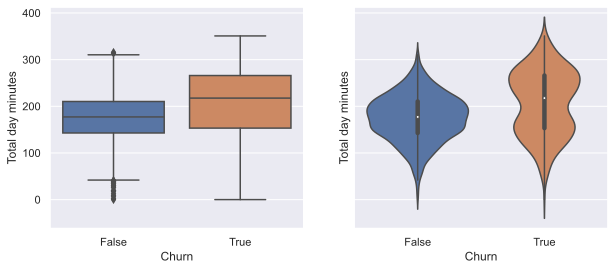

In [115]:
_, axes = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(10, 4))

sns.boxplot(data=df, x="Churn", y="Total day minutes", ax=axes[0])
sns.violinplot(data=df, x="Churn", y="Total day minutes", ax=axes[1])

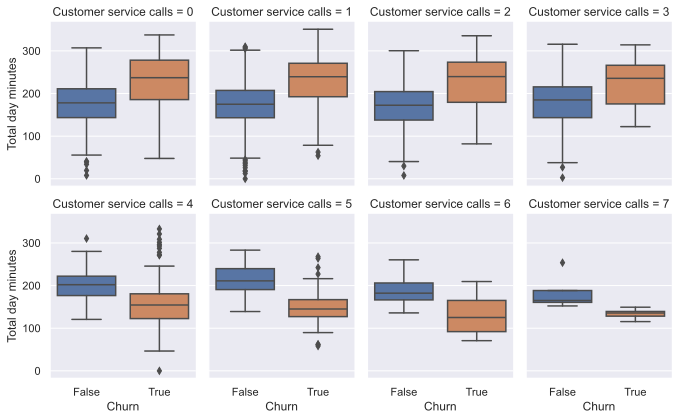

In [116]:
sns.catplot(
    x="Churn",
    y="Total day minutes",
    col="Customer service calls",
    data=df[df["Customer service calls"] < 8],
    kind="box",
    col_wrap=4,
    height=3,
    aspect=0.8,
);

## 3.3 Categorical vs. Categorical

AttributeError: 'numpy.bool_' object has no attribute 'startswith'

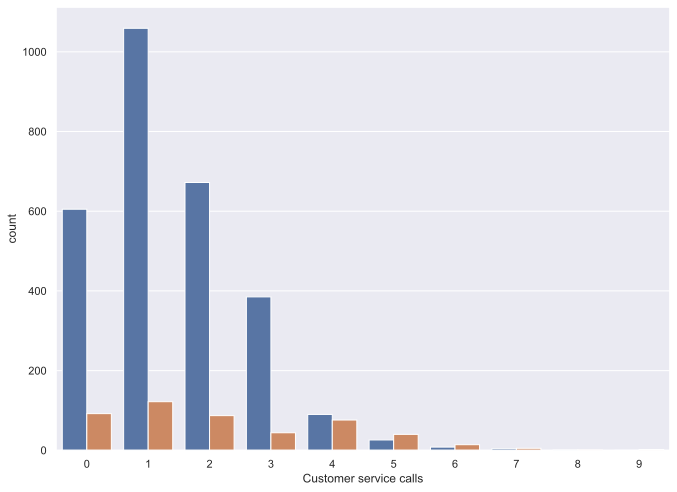

In [117]:
sns.countplot(data=df, x="Customer service calls", hue="Churn")

AttributeError: 'numpy.bool_' object has no attribute 'startswith'

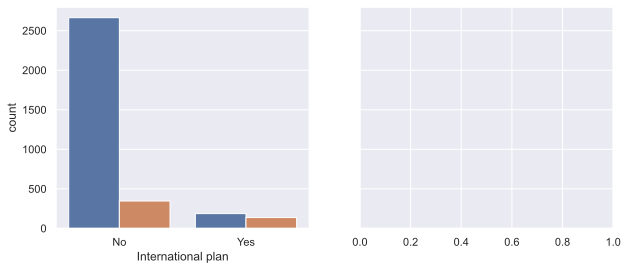

In [120]:
_, axes = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(10, 4))

sns.countplot(data=df, x="International plan", hue='Churn', ax=axes[0])
sns.countplot(data=df, x="Voice mail plan", hue='Churn', ax=axes[1])
                    

In [121]:
pd.crosstab(df["State"], df["Churn"]).T

State,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Churn,,,,,,,,,,,,,,,,,,,,,
False,49,72,44,60,25,57,62,49,52,55,...,52,48,54,62,72,65,52,71,96,68
True,3,8,11,4,9,9,12,5,9,8,...,8,5,18,10,5,8,14,7,10,9


In [122]:
df.groupby(["State"])['Churn'].agg(["mean"]).sort_values(by="mean", ascending=False).T

State,NJ,CA,TX,MD,SC,MI,MS,NV,WA,ME,...,RI,WI,IL,NE,LA,IA,VA,AZ,AK,HI
mean,0.264706,0.264706,0.25,0.242857,0.233333,0.219178,0.215385,0.212121,0.212121,0.209677,...,0.092308,0.089744,0.086207,0.081967,0.078431,0.068182,0.064935,0.0625,0.057692,0.056604


## Whole dataset visualizations

### t-SNE

In [123]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

In [124]:
# преобразуем все признаки в числовые, выкинув штаты
X = df.drop(["Churn", "State"], axis=1)
X["International plan"] = X["International plan"].map({"Yes": 1, "No": 0})
X["Voice mail plan"] = X["Voice mail plan"].map({"Yes": 1, "No": 0})

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [125]:
%%time
tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(X_scaled)

CPU times: total: 43.5 s
Wall time: 16.9 s


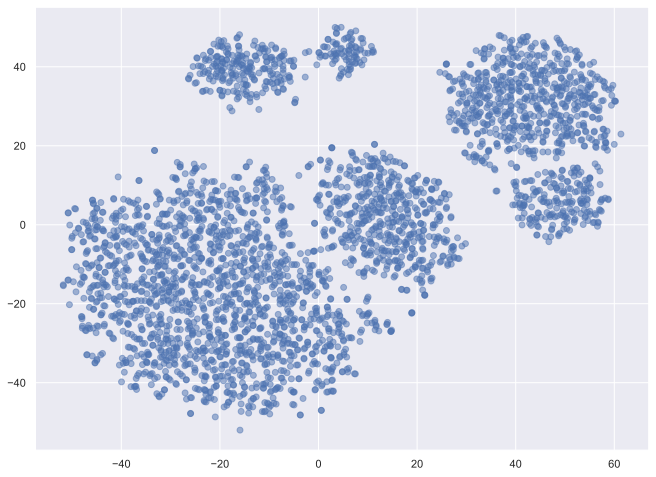

In [126]:
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5);

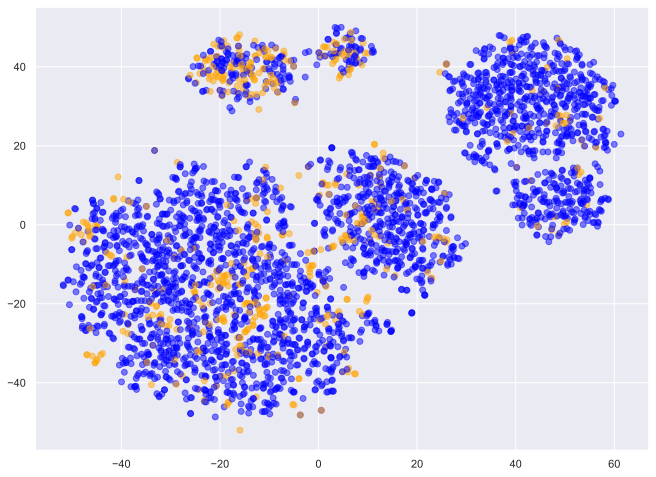

In [127]:
plt.scatter(
    tsne_repr[:, 0],
    tsne_repr[:, 1],
    c=df["Churn"].map({False: "blue", True: "orange"}),
    alpha=0.5,
);

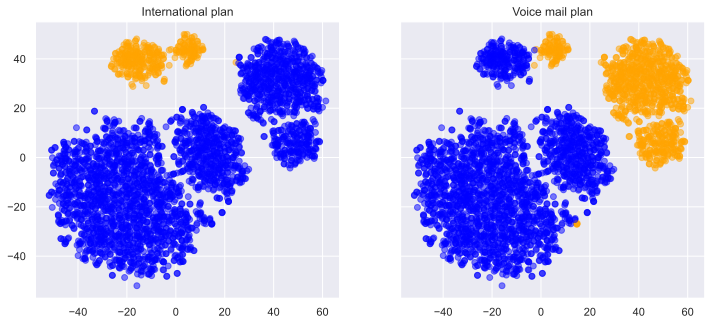

In [128]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 5))

for i, name in enumerate(["International plan", "Voice mail plan"]):
    axes[i].scatter(
        tsne_repr[:, 0],
        tsne_repr[:, 1],
        c=df[name].map({"Yes": "orange", "No": "blue"}),
        alpha=0.5,
    )
    axes[i].set_title(name);

# Visual data analysis. Part 2. Overview of Seaborn, Matplotlib and Plotly libraries

In [129]:
# Matplotlib forms basis for visualization in Python
import matplotlib.pyplot as plt

# We will use the Seaborn library
import seaborn as sns

sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

# Increase the default plot size and set the color scheme
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["image.cmap"] = "viridis"
import pandas as pd

In [130]:
DATA_URL = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/"

In [131]:
df = pd.read_csv(DATA_URL + "video_games_sales.csv").dropna()
df.shape

(6825, 16)

In [132]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6825 entries, 0 to 16706
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             6825 non-null   object 
 1   Platform         6825 non-null   object 
 2   Year_of_Release  6825 non-null   float64
 3   Genre            6825 non-null   object 
 4   Publisher        6825 non-null   object 
 5   NA_Sales         6825 non-null   float64
 6   EU_Sales         6825 non-null   float64
 7   JP_Sales         6825 non-null   float64
 8   Other_Sales      6825 non-null   float64
 9   Global_Sales     6825 non-null   float64
 10  Critic_Score     6825 non-null   float64
 11  Critic_Count     6825 non-null   float64
 12  User_Score       6825 non-null   object 
 13  User_Count       6825 non-null   float64
 14  Developer        6825 non-null   object 
 15  Rating           6825 non-null   object 
dtypes: float64(9), object(7)
memory usage: 906.4+ KB


In [133]:
df["User_Score"] = df["User_Score"].astype("float64")
df["Year_of_Release"] = df["Year_of_Release"].astype("int64")
df["User_Count"] = df["User_Count"].astype("int64")
df["Critic_Count"] = df["Critic_Count"].astype("int64")

In [134]:
df.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51,8.0,322,Nintendo,E
2,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73,8.3,709,Nintendo,E
3,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73,8.0,192,Nintendo,E
6,New Super Mario Bros.,DS,2006,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65,8.5,431,Nintendo,E
7,Wii Play,Wii,2006,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41,6.6,129,Nintendo,E


In [135]:
useful_cols = [
    "Name",
    "Platform",
    "Year_of_Release",
    "Genre",
    "Global_Sales",
    "Critic_Score",
    "Critic_Count",
    "User_Score",
    "User_Count",
    "Rating",
]
df[useful_cols].head()

,Name,Platform,Year_of_Release,Genre,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006,Sports,82.53,76.0,51,8.0,322,E
2,Mario Kart Wii,Wii,2008,Racing,35.52,82.0,73,8.3,709,E
3,Wii Sports Resort,Wii,2009,Sports,32.77,80.0,73,8.0,192,E
6,New Super Mario Bros.,DS,2006,Platform,29.80,89.0,65,8.5,431,E
7,Wii Play,Wii,2006,Misc,28.92,58.0,41,6.6,129,E


### 2. DataFrame.plot()

In [136]:
l1 = [x for x in df.columns if 'Sales' in x]
l1

['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']

In [137]:
df[[x for x in df.columns if 'Sales' in x] + ['Year_of_Release']].head()

,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Year_of_Release
0,41.36,28.96,3.77,8.45,82.53,2006
2,15.68,12.76,3.79,3.29,35.52,2008
3,15.61,10.93,3.28,2.95,32.77,2009
6,11.28,9.14,6.50,2.88,29.80,2006
7,13.96,9.18,2.93,2.84,28.92,2006


In [138]:
df[[x for x in df.columns if 'Sales' in x] + ['Year_of_Release']].groupby('Year_of_Release').sum().head()

,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
Year_of_Release,,,,,
1985,0.00,0.03,0.00,0.01,0.03
1988,0.00,0.02,0.00,0.01,0.03
1992,0.02,0.00,0.00,0.00,0.03
1994,0.39,0.26,0.53,0.08,1.27
1996,7.91,6.88,4.06,1.24,20.10


<Axes: xlabel='Year_of_Release'>

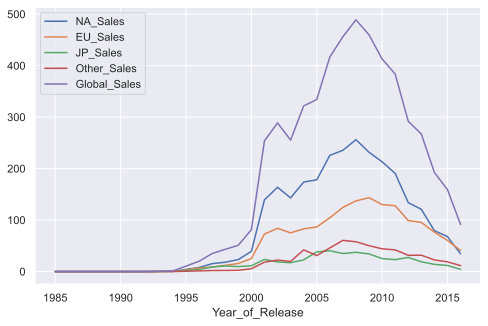

In [139]:
df[[x for x in df.columns if 'Sales' in x] + ['Year_of_Release']].groupby('Year_of_Release').sum().plot()

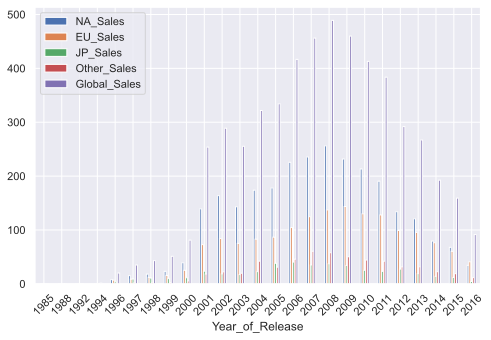

In [140]:
df[[x for x in df.columns if "Sales" in x] + ["Year_of_Release"]].groupby(
    "Year_of_Release"
).sum().plot(kind="bar", rot=45);

### 3. Seaborn

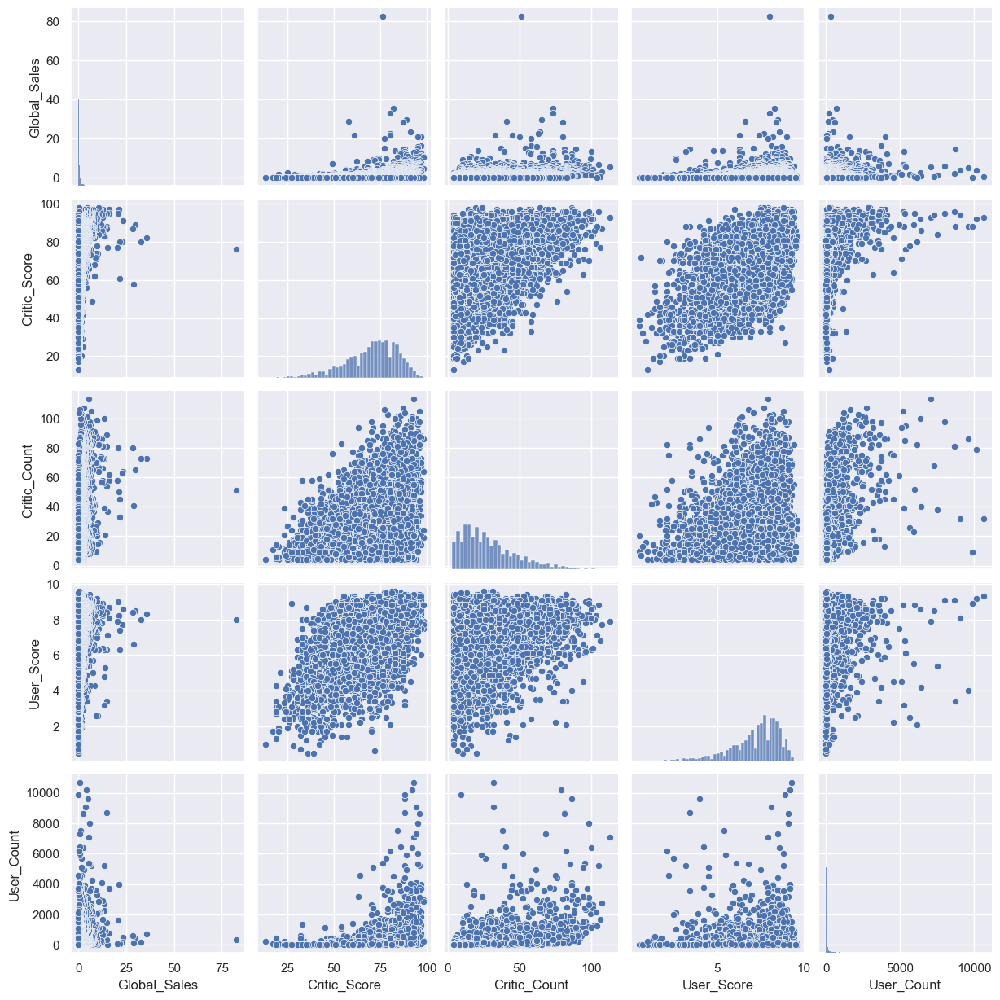

In [141]:
# `pairplot()` may become very slow with the SVG format
%config InlineBackend.figure_format = 'png'
sns.pairplot(
    df[["Global_Sales", "Critic_Score", "Critic_Count", "User_Score", "User_Count"]]
);

<Axes: xlabel='Critic_Score', ylabel='Density'>

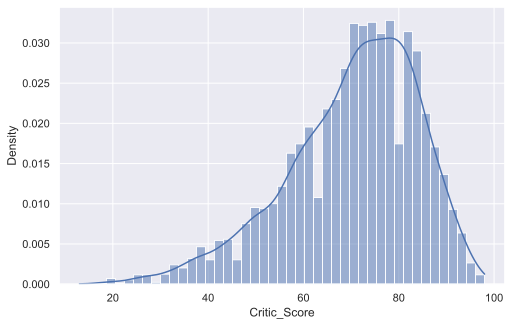

In [142]:
%config InlineBackend.figure_format = 'svg'
sns.histplot(data=df["Critic_Score"], kde=True, stat='density')

<Axes: xlabel='Critic_Score', ylabel='Count'>

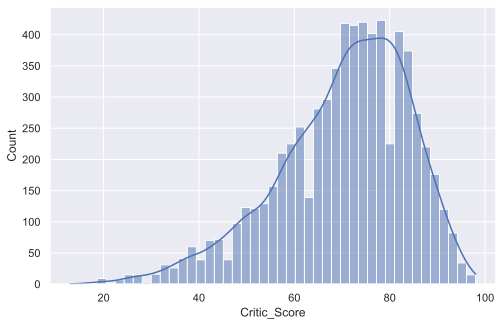

In [143]:
sns.histplot(data=df["Critic_Score"], kde=True)

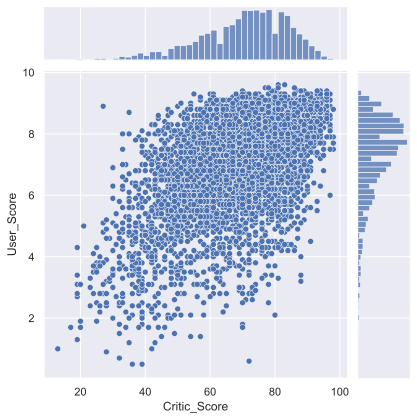

In [144]:
sns.jointplot(data=df, x="Critic_Score", y="User_Score")

In [145]:
df["Platform"].value_counts().sort_values(ascending=False).head(5).index.values

array(['PS2', 'X360', 'PS3', 'PC', 'XB'], dtype=object)

In [146]:
top_platforms = (
    df["Platform"].value_counts().sort_values(ascending=False).head(5).index.values
)

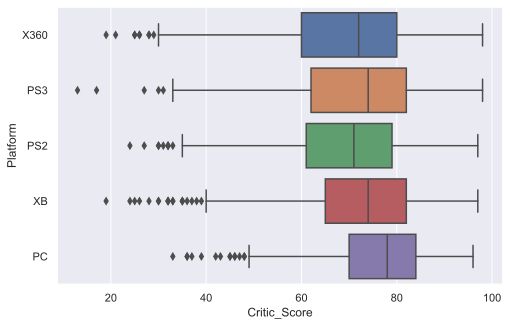

In [147]:
sns.boxplot(
    y="Platform",
    x="Critic_Score",
    data=df[df["Platform"].isin(top_platforms)],
    orient="h",
);

<Axes: xlabel='Genre', ylabel='Platform'>

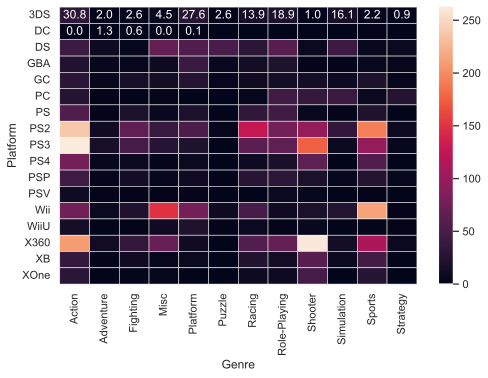

In [148]:
platform_genre_sales = df.pivot_table(
    index='Platform',
    columns='Genre',
    values='Global_Sales',
    aggfunc=sum
).fillna(0).applymap(float)

sns.heatmap(data=platform_genre_sales, annot=True, fmt='.1f', linewidths=.5)

<Axes: xlabel='Genre', ylabel='Platform'>

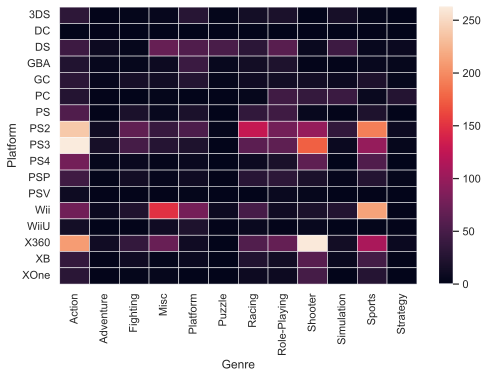

In [149]:
platform_genre_sales = df.pivot_table(
    index='Platform',
    columns='Genre',
    values='Global_Sales',
    aggfunc=sum
).fillna(0).applymap(float)

sns.heatmap(data=platform_genre_sales, annot=False, fmt='.1f', linewidths=.5)

### 4. Plotly

**Plotly — это open-source библиотека, которая позволяет строить интерактивные графики в jupyter.notebook'e без необходимости зарываться в javascript код.**

In [150]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly
import plotly.graph_objs as go

init_notebook_mode(connected=True)

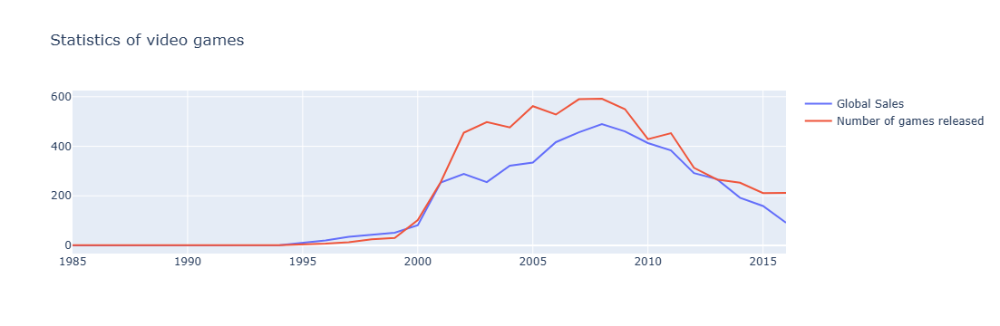

In [151]:
# посчитаем число вышедших игр и проданных копий по годам
years_df = df.groupby('Year_of_Release')[['Global_Sales']].sum().join(
    df.groupby('Year_of_Release')[['Name']].count()
)
years_df.columns = ['Global_Sales', 'Number_of_Games']

# создаем линию для числа проданных копий
trace0 = go.Scatter(
    x=years_df.index,
    y=years_df.Global_Sales,
    name='Global Sales'
)

# создаем линию для числа вышедших игр 
trace1 = go.Scatter(
    x=years_df.index,
    y=years_df.Number_of_Games,
    name='Number of games released'
)

# определяем массив данных и задаем title графика в layout
data = [trace0, trace1]
layout = {'title': 'Statistics of video games'}

# cоздаем объект Figure и визуализируем его
fig = go.Figure(data=data, layout=layout)
iplot(fig, show_link=False)

В plotly строится визуализация объекта Figure, который состоит из данных (массив линий, которые в библиотеке называются traces) и оформления/стиля, за который отвечает объект layout. В простых случаях можно вызывать функцию iplot и просто от массива traces.


Параметр show_link отвечает за ссылки на online-платформу plot.ly на графиках. Поскольку обычно это функциональность не нужна, то я предпочитаю скрывать ее для предотвращения случайных нажатий.

In [152]:
# Можно сразу сохранить график в виде html-файла.
plotly.offline.plot(fig, filename='years_stats.html', show_link=False)

'years_stats.html'

Посмотрим также на рыночную долю игровых платформ, рассчитанную по количеству выпущенных игр и по суммарной выручке. Для этого построим bar chart.

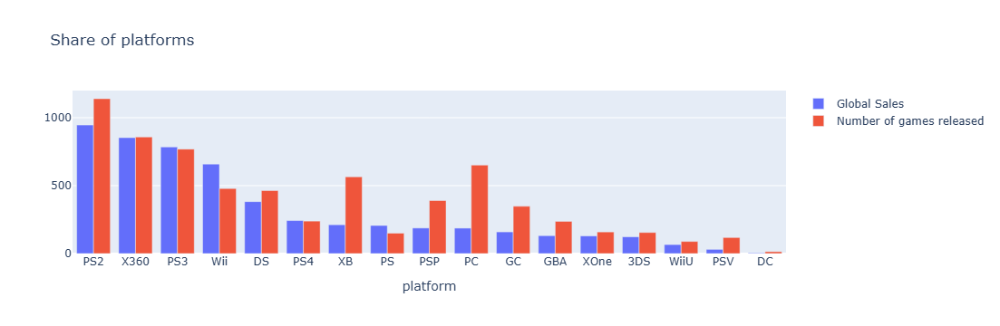

In [153]:
# считаем число проданных и вышедших игр по платформам
platforms_df = df.groupby('Platform')[['Global_Sales']].sum().join(
    df.groupby('Platform')[['Name']].count()
)
platforms_df.columns = ['Global_Sales', 'Number_of_Games']
platforms_df.sort_values('Global_Sales', ascending=False, inplace=True)

# создаем traces для визуализации
trace0 = go.Bar(
    x=platforms_df.index,
    y=platforms_df.Global_Sales,
    name='Global Sales'
)

trace1 = go.Bar(
    x=platforms_df.index,
    y=platforms_df.Number_of_Games,
    name='Number of games released'
)

# создаем массив с данными и задаем title для графика и оси x в layout
data = [trace0, trace1]
layout = {'title': 'Share of platforms', 'xaxis': {'title': 'platform'}}

# создаем объект Figure и визуализируем его
fig = go.Figure(data=data, layout=layout)
iplot(fig, show_link=False)

В plotly можно построить и box plot. Рассмотрим распределения оценок критиков в зависимости от жанра игры.

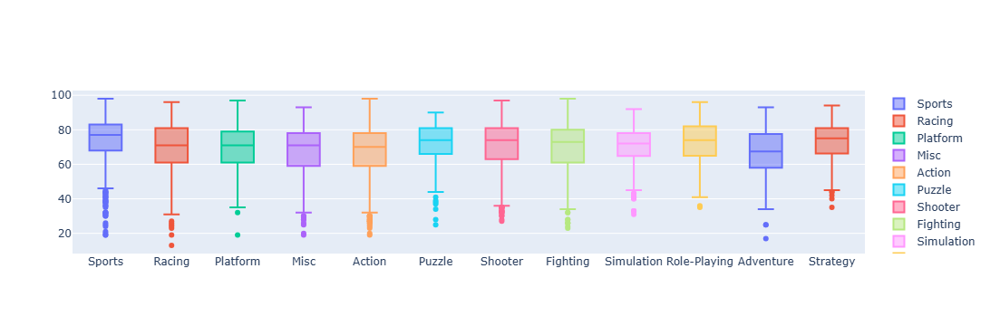

In [154]:
# создаем Box trace для каждого жанра из наших данных
data = []
for genre in df.Genre.unique():
    data.append(
        go.Box(y=df[df.Genre==genre].Critic_Score, name=genre)
    )

# визуализируем данные
iplot(data, show_link = False)

### Task Visualisation

In [155]:
# Import all required modules
# Disable warnings
import warnings

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")

# Import plotting modules and set up
import seaborn as sns

sns.set()
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [156]:
# Tune the visual settings for figures in `seaborn`
sns.set_context(
    "notebook", font_scale=1.5, rc={"figure.figsize": (11, 8), "axes.titlesize": 18}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 11, 8

In [157]:
DATA_PATH = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/"

In [158]:
df = pd.read_csv(DATA_PATH + "mlbootcamp5_train.csv", sep=";")
print("Dataset size: ", df.shape)
df.head()

Dataset size:  (70000, 13)


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


**pd.melt** — преобразует таблицу из "широкого" формата в "длинный".

frame=df — указывает на исходный DataFrame с данными.

value_vars=["gender", "cholesterol", "gluc", "smoke", "alco", "active", "cardio"] — перечисляет столбцы, которые нужно преобразовать в длинный формат.

In [159]:
df_uniques = pd.melt(
    frame=df,
    value_vars=["gender", "cholesterol", "gluc", "smoke", "alco", "active", "cardio"],
)
df_uniques

,variable,value
0,gender,2
1,gender,1
2,gender,1
3,gender,2
4,gender,1
...,...,...
489995,cardio,0
489996,cardio,1
489997,cardio,1
489998,cardio,1


In [160]:
df_uniques = (
    pd.DataFrame(df_uniques.groupby(["variable", "value"])["value"].count())
    .sort_index(level=[0, 1])
    .rename(columns={"value": "count"})
    .reset_index()
)
df_uniques

,variable,value,count
0,active,0,13739
1,active,1,56261
2,alco,0,66236
3,alco,1,3764
4,cardio,0,35021
5,cardio,1,34979
6,cholesterol,1,52385
7,cholesterol,2,9549
8,cholesterol,3,8066
9,gender,1,45530


AttributeError: 'numpy.int64' object has no attribute 'startswith'

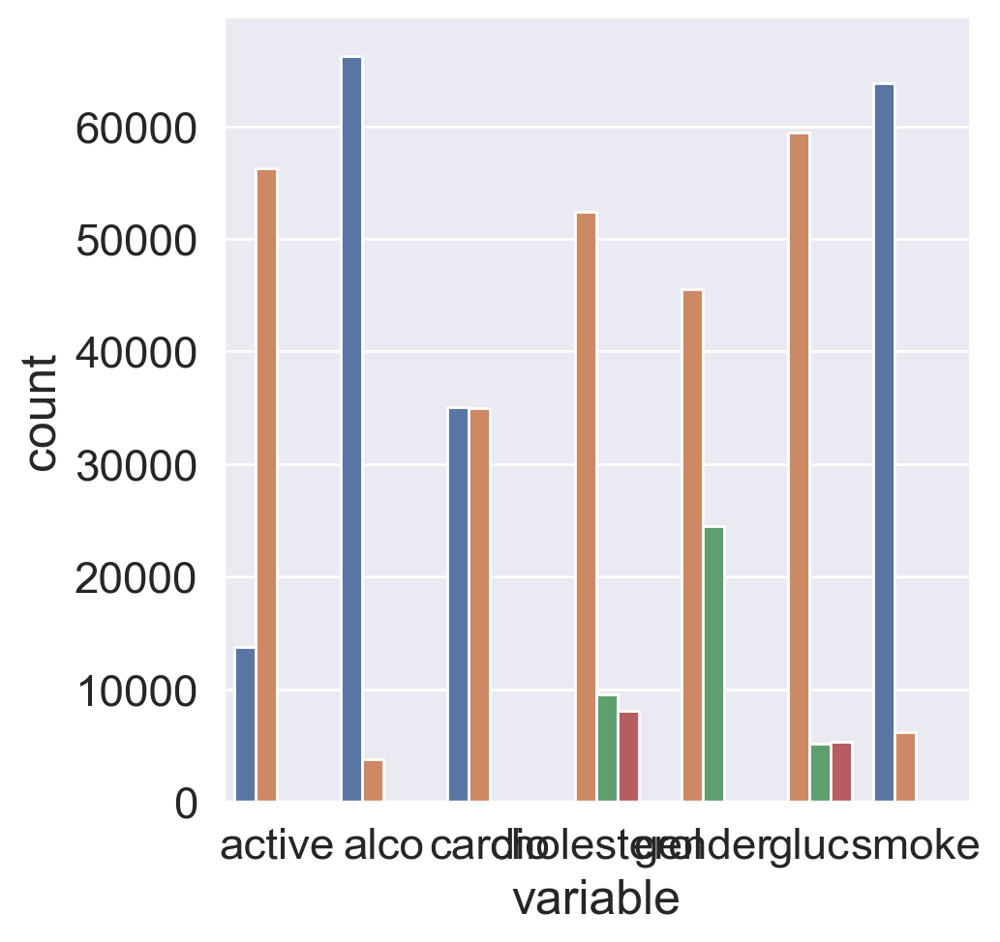

In [161]:
sns.catplot(
    x="variable", y="count", hue="value", data=df_uniques, kind="bar"
)
plt.xticks(rotation='vertical');

In [ ]:
df_uniques = pd.melt(
    frame=df,
    value_vars=["gender", "cholesterol", "gluc", "smoke", "alco", "active"],
    id_vars=["cardio"],
)
df_uniques = (
    pd.DataFrame(df_uniques.groupby(["variable", "value", "cardio"])["value"].count())
    .sort_index(level=[0, 1])
    .rename(columns={"value": "count"})
    .reset_index()
)

sns.catplot(
    x="variable",
    y="count",
    hue="value",
    col="cardio",
    data=df_uniques,
    kind="bar",
)
plt.xticks(rotation='vertical');

In [162]:
for c in df.columns:
    n = df[c].nunique()
    print(c)
    if n <= 3:
        print(n, sorted(df[c].value_counts().to_dict().items()))
    else:
        print(n)
    print(10 * "-")

id
70000
----------
age
8076
----------
gender
2 [(1, 45530), (2, 24470)]
----------
height
109
----------
weight
287
----------
ap_hi
153
----------
ap_lo
157
----------
cholesterol
3 [(1, 52385), (2, 9549), (3, 8066)]
----------
gluc
3 [(1, 59479), (2, 5190), (3, 5331)]
----------
smoke
2 [(0, 63831), (1, 6169)]
----------
alco
2 [(0, 66236), (1, 3764)]
----------
active
2 [(0, 13739), (1, 56261)]
----------
cardio
2 [(0, 35021), (1, 34979)]
----------


#### 1.1. Basic observations
**Question 1.1. How many men and women are present in this dataset?**

In [163]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [164]:
df["gender"].value_counts()

gender
1    45530
2    24470
Name: count, dtype: int64

In [165]:
df.groupby(["gender"])['height'].agg('mean').round()

gender
1    161.0
2    170.0
Name: height, dtype: float64

45 530 women and 24 470 men

**Question 1.2. Who more often report consuming alcohol – men or women?**

In [166]:
df.groupby(['gender'])['alco'].agg('sum')

gender
1    1161
2    2603
Name: alco, dtype: int64

Answer - men

**Question 1.3. What’s the rounded difference between the percentages of smokers among men and women?**

In [167]:
pd.crosstab(df['gender'], df['smoke'], normalize=True).round(2)

smoke,0,1
gender,,
1,0.64,0.01
2,0.27,0.08


In [168]:
pd.crosstab(df['gender'][df['smoke'] == 1], df['smoke'], normalize=True).round(2)

smoke,1
gender,
1,0.13
2,0.87


In [169]:
df.groupby(['gender'])['smoke'].mean()

gender
1    0.017856
2    0.218880
Name: smoke, dtype: float64

In [170]:
df.loc[df["gender"] == 2, "smoke"].mean()

0.21888026154474868

In [171]:
df.loc[df["gender"] == 1, "smoke"].mean()

0.017856358444981332

In [172]:
df.loc[df["gender"] == 2, "smoke"].mean() - df.loc[df["gender"] == 1, "smoke"].mean()

0.20102390309976736

In [173]:
round((df.loc[df["gender"] == 2, "smoke"].mean() - df.loc[df["gender"] == 1, "smoke"].mean())*100)

20

**Question 1.4. What’s the rounded difference between median values of age (in months) for non-smokers and smokers? You’ll need to figure out the units of feature age in this dataset.**

In [174]:
df.groupby(["smoke"])['age'].median()/365.25

smoke
0    53.995893
1    52.361396
Name: age, dtype: float64

In [175]:
(df[df["smoke"] == 0]['age'].median() - df[df["smoke"] == 1]['age'].median())

597.0

In [176]:
(df[df["smoke"] == 0]['age'].median() - df[df["smoke"] == 1]['age'].median()) / 365.25 * 12

19.613963039014372

#### 1.2. Risk maps

**Question 1.5. Calculate fractions of ill people (with CVD) in the two groups of people described in the task. What’s the ratio of these two fractions?**

In [177]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [178]:
df["age_years"] = (df['age'] / 365.25).round().astype('int')
df["age_years"]

0        50
1        55
2        52
3        48
4        48
         ..
69995    53
69996    62
69997    52
69998    61
69999    56
Name: age_years, Length: 70000, dtype: int32

In [179]:
df["age_years"].max()

65

In [180]:
smoking_old_men = df[(df['gender'] == 2) & (df['age_years'] >= 60) & (df['age_years'] < 65) & (df['smoke'] == 1)]
smoking_old_men.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years
19,29,21755,2,162,56.0,120,70,1,1,1,0,1,0,60
38,52,23388,2,162,72.0,130,80,1,1,1,0,1,1,64
67,90,22099,2,171,97.0,150,100,3,1,1,0,1,1,61
177,240,21848,2,170,69.0,120,80,1,1,1,1,1,0,60
182,248,22671,2,174,74.0,130,80,3,1,1,0,1,1,62


In [181]:
smoking_old_men[(smoking_old_men['ap_hi'] < 120) 
                & (smoking_old_men['cholesterol'] == 1)]['cardio'].mean()

0.2631578947368421

In [182]:
smoking_old_men[(smoking_old_men['ap_hi'] >= 160) 
                & (smoking_old_men['ap_hi'] < 180) 
                & (smoking_old_men['cholesterol'] == 3)]['cardio'].mean()

0.8636363636363636

#### 1.3. Analyzing BMI

Create a new feature – **BMI (Body Mass Index)**. To do this, divide weight in kilograms by the square of height in meters. Normal BMI values are said to be from 18.5 to 25.

In [183]:
df['BMI'] = df['weight'] / (df['height'] / 100) ** 2

**Question 1.6. (2 points). Choose the correct statements:.**

1) Median BMI in the sample is within boundaries of normal values.

2) Women’s BMI is on average higher then men’s.

3) Healthy people have higher median BMI than ill people.

4) In the segment of healthy and non-drinking men BMI is closer to the norm than in the segment of healthy and non-drinking women

In [184]:
df['BMI'].median()

26.374068120774975

normal BMI should be from 18.5 to 25, our BMI > 25 - that's false

In [185]:
df.groupby('gender')['BMI'].agg('mean')

gender
1    27.987583
2    26.754442
Name: BMI, dtype: float64

In [186]:
df.groupby(['gender', 'alco', 'cardio'])['BMI'].agg('median').to_frame()

BMI
gender alco cardio           
1      0    0       25.654372
            1       27.885187
       1    0       27.885187
            1       30.110991
2      0    0       25.102391
            1       26.674874
       1    0       25.351541
            1       27.530797

#### 1.4. Cleaning data

**Question 1.7. What percent of the original data (rounded) did we filter out in the previous step?**

In [187]:
df_to_remove = df[
    (df["ap_lo"] > df["ap_hi"])
    | (df["height"] < df["height"].quantile(0.025))
    | (df["height"] > df["height"].quantile(0.975))
    | (df["weight"] < df["weight"].quantile(0.025))
    | (df["weight"] > df["weight"].quantile(0.975))
]
print(df_to_remove.shape[0] / df.shape[0])

filtered_df = df[~df.index.isin(df_to_remove)]

0.0963


#### 2.1. Correlation matrix visualization

**Question 2.1. Which pair of features has the strongest Pearson’s correlation with the gender feature?**

In [188]:
filtered_df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,BMI
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,50,21.967120
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,48,28.710479
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177


In [189]:
corr = filtered_df.corr(method='pearson')
corr

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,BMI
id,1.000000,0.003457,0.003502,-0.003038,-0.001830,0.003356,-0.002529,0.006106,0.002467,-0.003699,0.001210,0.003755,0.003799,0.003048,-0.001377
age,0.003457,1.000000,-0.022811,-0.081515,0.053684,0.020764,0.017647,0.154424,0.098703,-0.047633,-0.029723,-0.009927,0.238159,0.999089,0.085512
gender,0.003502,-0.022811,1.000000,0.499033,0.155406,0.006005,0.015254,-0.035821,-0.020491,0.338135,0.170966,0.005866,0.008109,-0.022905,-0.096529
height,-0.003038,-0.081515,0.499033,1.000000,0.290968,0.005488,0.006150,-0.050226,-0.018595,0.187989,0.094419,-0.006570,-0.010821,-0.081349,-0.290642
weight,-0.001830,0.053684,0.155406,0.290968,1.000000,0.030702,0.043710,0.141768,0.106857,0.067780,0.067113,-0.016867,0.181660,0.053574,0.762009
ap_hi,0.003356,0.020764,0.006005,0.005488,0.030702,1.000000,0.016086,0.023778,0.011841,-0.000922,0.001408,-0.000033,0.054475,0.020458,0.024852
ap_lo,-0.002529,0.017647,0.015254,0.006150,0.043710,0.016086,1.000000,0.024019,0.010806,0.005186,0.010601,0.004780,0.065719,0.017603,0.035345
cholesterol,0.006106,0.154424,-0.035821,-0.050226,0.141768,0.023778,0.024019,1.000000,0.451578,0.010354,0.035760,0.009911,0.221147,0.154383,0.146270
gluc,0.002467,0.098703,-0.020491,-0.018595,0.106857,0.011841,0.010806,0.451578,1.000000,-0.004756,0.011246,-0.006770,0.089307,0.098443,0.101390
smoke,-0.003699,-0.047633,0.338135,0.187989,0.067780,-0.000922,0.005186,0.010354,-0.004756,1.000000,0.340094,0.025858,-0.015486,-0.047867,-0.027215


In [190]:
import sys
sys.executable

'C:\\Users\\Us\\anaconda3\\python.exe'

<Axes: >

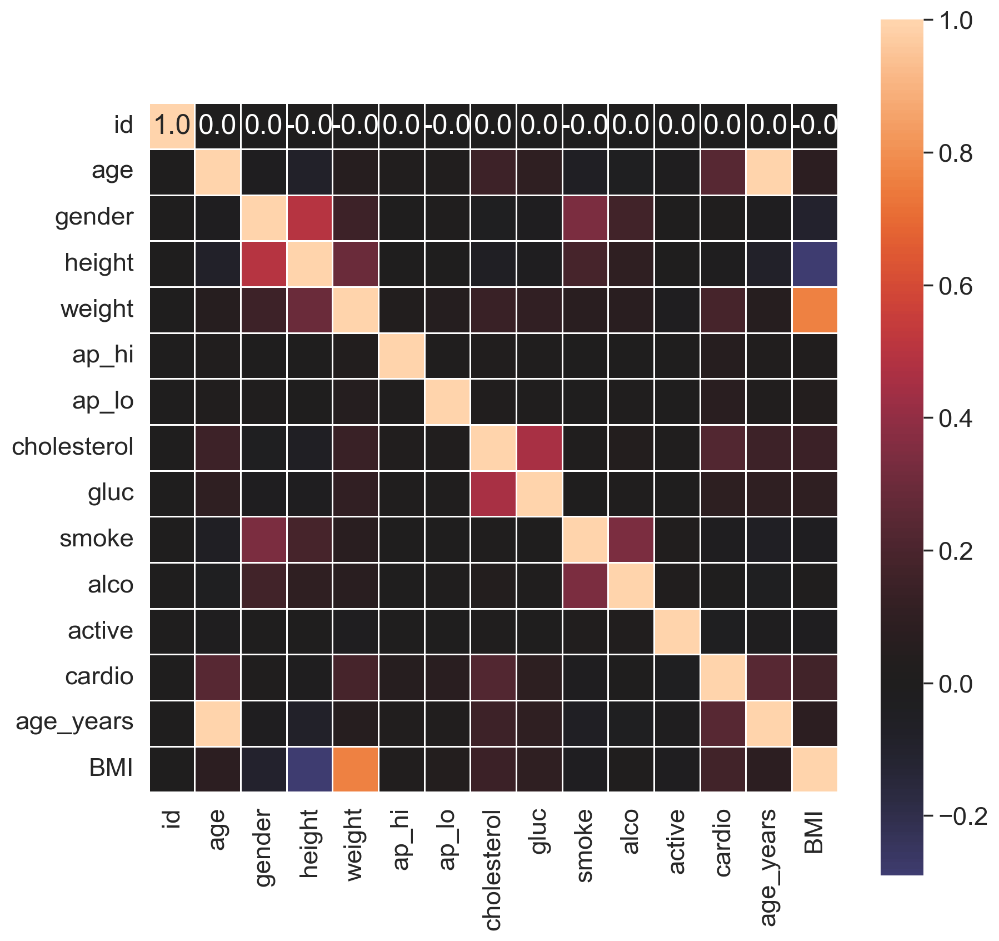

In [191]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr, ax=ax, vmax=1, center=0, annot=True, fmt='.1f', square=True, linewidth =0.5)

1) Cardio, Cholesterol
2) **Height, Smoke**
3) Smoke, Alco
4) Height, Weight

#### 2.2. Height distribution of men and women

Create a violin plot for the height and gender using violinplot().

<Axes: xlabel='gender', ylabel='height'>

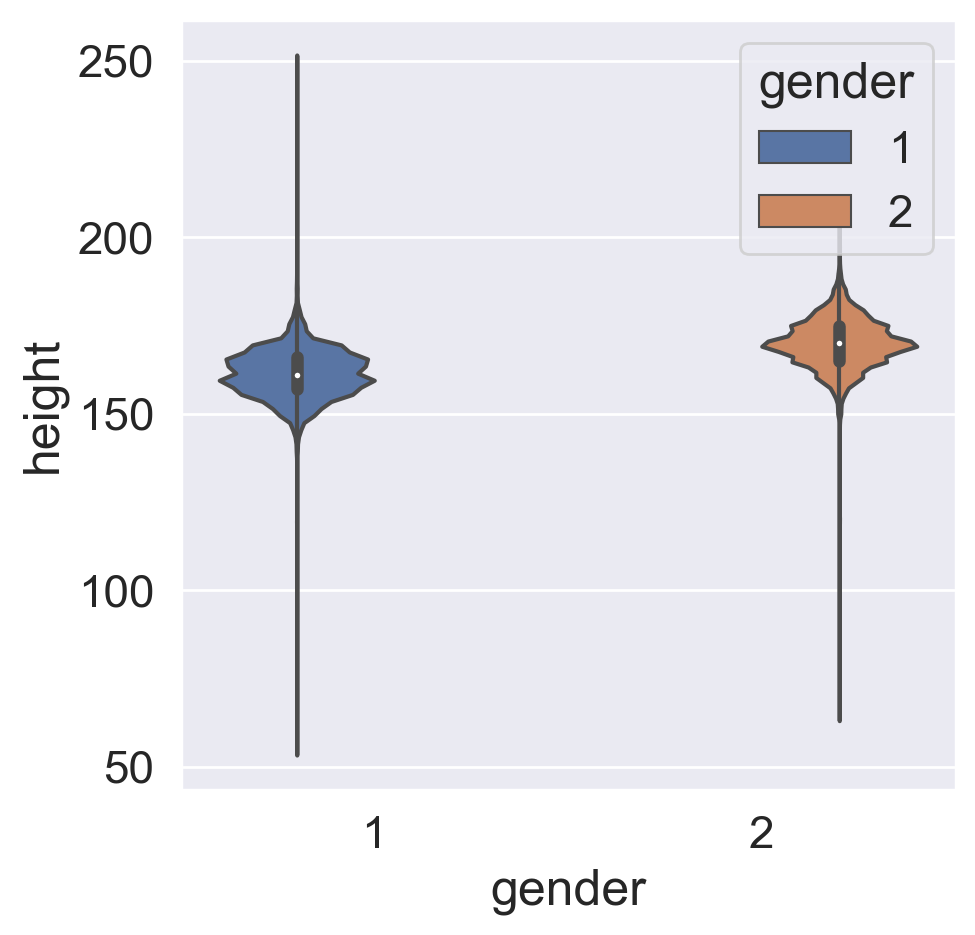

In [192]:
ax, fig = plt.subplots(figsize=(5, 5))
sns.violinplot(filtered_df, x='gender', y='height', hue='gender')

In [193]:
df_melt = pd.melt(frame=filtered_df, id_vars='gender', value_vars='height')
df_melt

,gender,variable,value
0,2,height,168
1,1,height,156
2,1,height,165
3,2,height,169
4,1,height,156
...,...,...,...
69995,2,height,168
69996,1,height,158
69997,2,height,183
69998,1,height,163


<Axes: xlabel='variable', ylabel='value'>

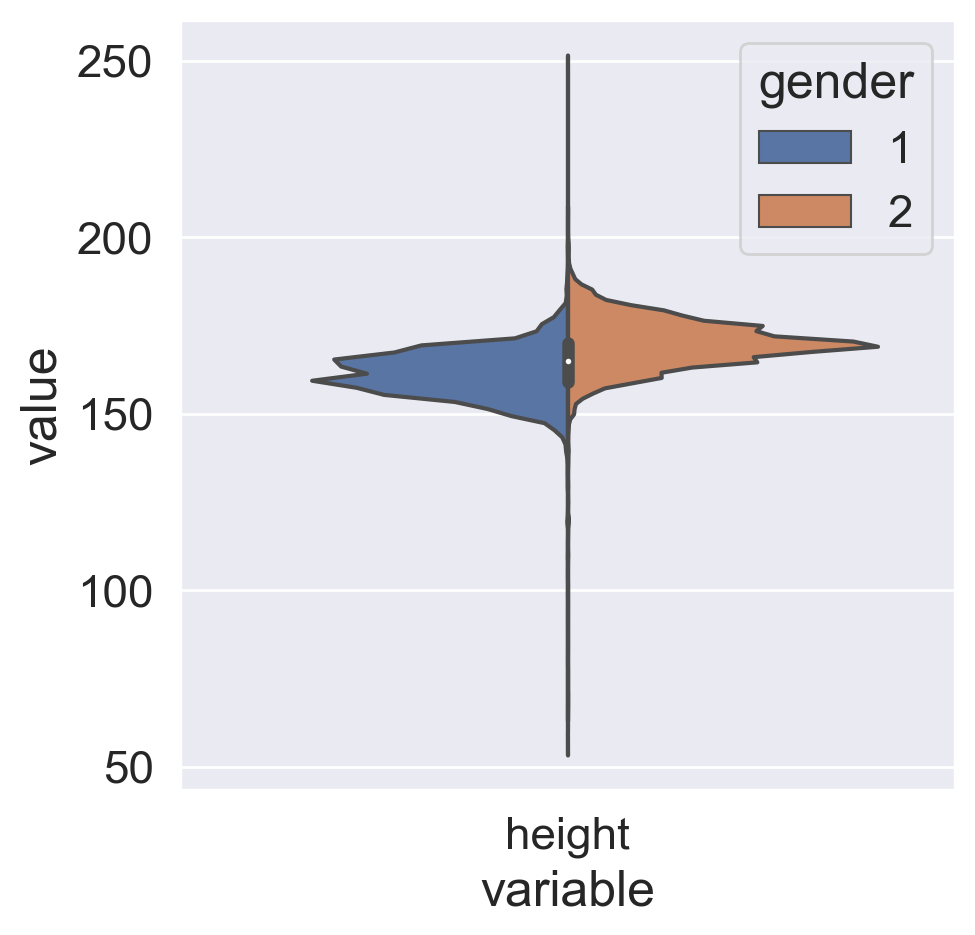

In [194]:
ax, fig = plt.subplots(figsize=(5, 5))
sns.violinplot(data=df_melt, x='variable', y='value', hue='gender', split=True, scale='area')

Create two kdeplots of the height feature for each gender on the same chart. You will see the difference between the genders more clearly, but you will be unable to evaluate the number of records in each of them.

<Axes: xlabel='height', ylabel='Density'>

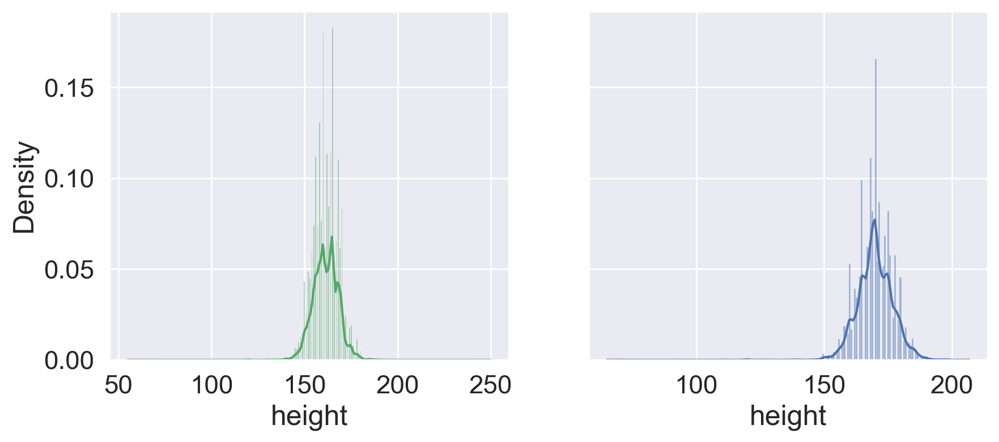

In [202]:
#ax, fig = plt.subplots(figsize=(5, 5))
#sns.countplot(data=df, x="International plan", hue='Churn', ax=axes[0])

_, axes = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(10, 4))

sns.histplot(data=filtered_df["height"][df['gender'] == 1], kde=True, stat='density', ax=axes[0], color='g')
sns.histplot(data=filtered_df["height"][df['gender'] == 2], kde=True, stat='density', ax=axes[1])

<Axes: xlabel='height', ylabel='Density'>

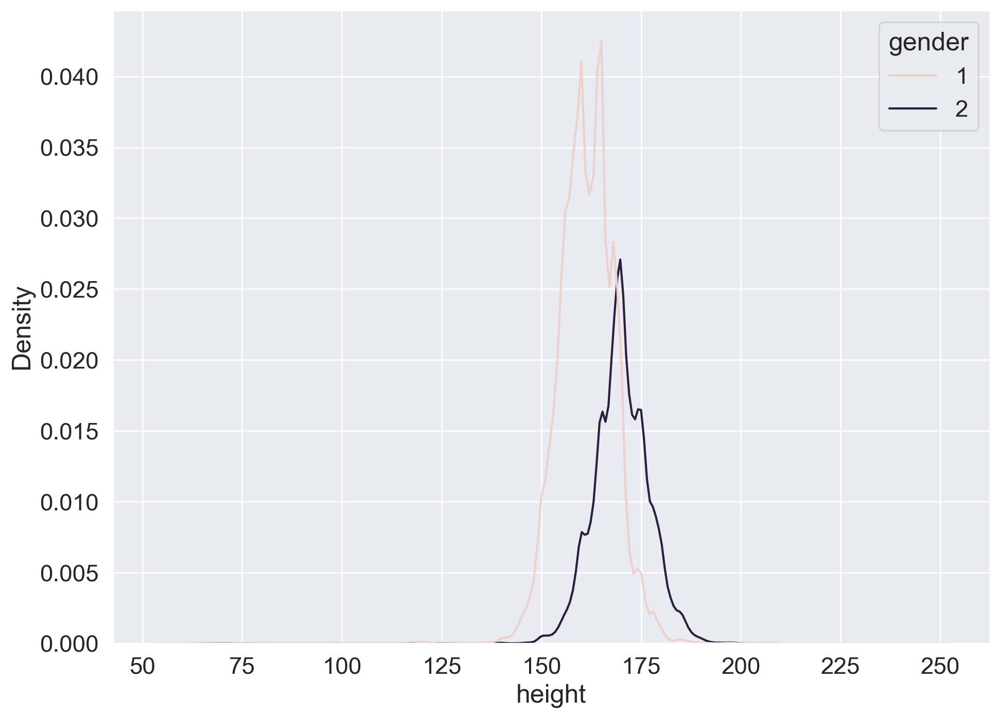

In [205]:
sns.kdeplot(data=filtered_df, x='height', hue='gender', palette=)

#### 2.3. Rank correlation

Calculate and plot a correlation matrix using the Spearman’s rank correlation coefficient.

**Question 2.2. Which pair of features has the strongest Spearman rank correlation?**

1) Height, Weight
2) Age, Weight
3) Cholesterol, Gluc
4) Cardio, Cholesterol
5) Ap_hi, Ap_lo
6) Smoke, Alco

In [87]:
corr = filtered_df.corr(method='spearman')
corr.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,BMI
id,1.000000,0.002682,0.003506,-0.001886,-0.001292,0.003258,-0.000238,0.005706,0.002789,-0.003697,0.001214,0.003766,0.003800,0.002367,-0.000472
age,0.002682,1.000000,-0.020176,-0.082292,0.061559,0.219087,0.156700,0.140113,0.091791,-0.047471,-0.030078,-0.010422,0.234429,0.998088,0.107610
gender,0.003506,-0.020176,1.000000,0.533805,0.172480,0.063174,0.066374,-0.035730,-0.018866,0.338135,0.170966,0.005866,0.008109,-0.020636,-0.087531
height,-0.001886,-0.082292,0.533805,1.000000,0.313569,0.019381,0.030534,-0.058940,-0.024369,0.197632,0.096670,-0.007367,-0.012383,-0.083594,-0.182390
weight,-0.001292,0.061559,0.172480,0.313569,1.000000,0.277749,0.254420,0.137908,0.109901,0.071676,0.068088,-0.014894,0.182701,0.062956,0.848271


<Axes: >

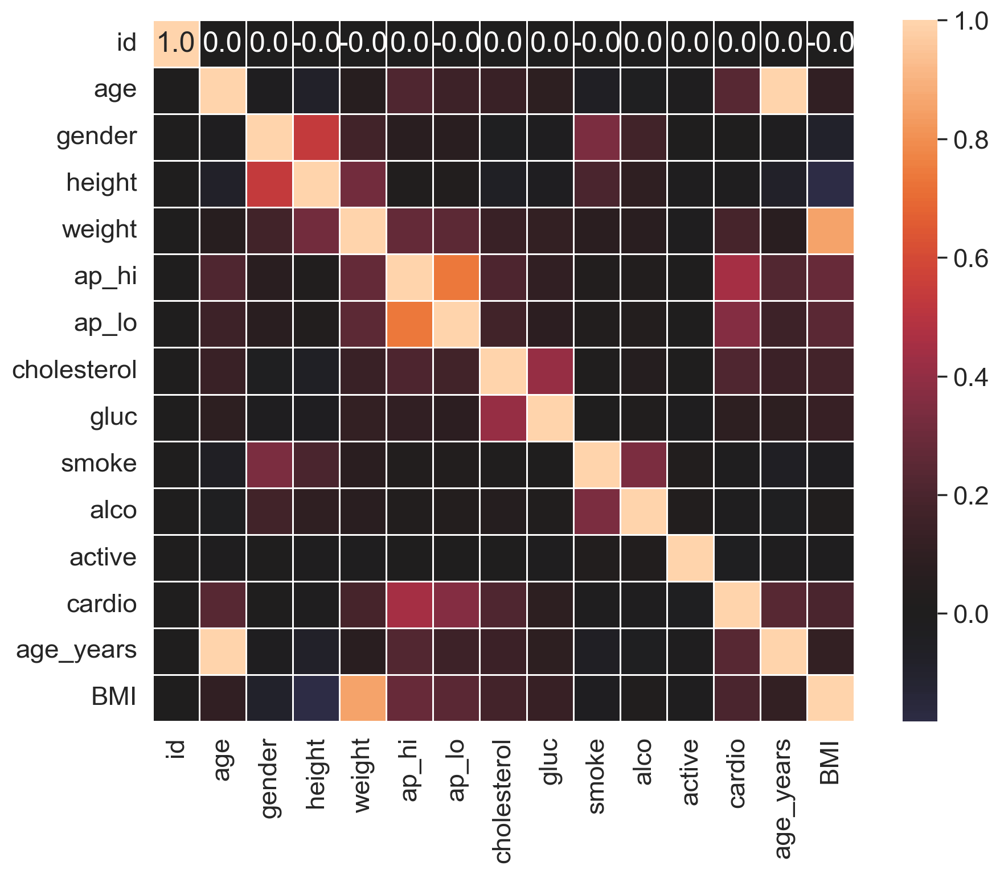

In [88]:
sns.heatmap(corr, annot=True, fmt='.1f', linewidths=0.5, center=0, square=True)

#### 2.4. Age

Create a count plot using countplot(), with the age on the X axis and the number of people on the Y axis. Each value of the age should have two columns corresponding to the numbers of people of this age for each cardio class.

**Question 2.4. What is the smallest age at which the number of people with CVD outnumbers the number of people without CVD?**

AttributeError: 'numpy.int64' object has no attribute 'startswith'

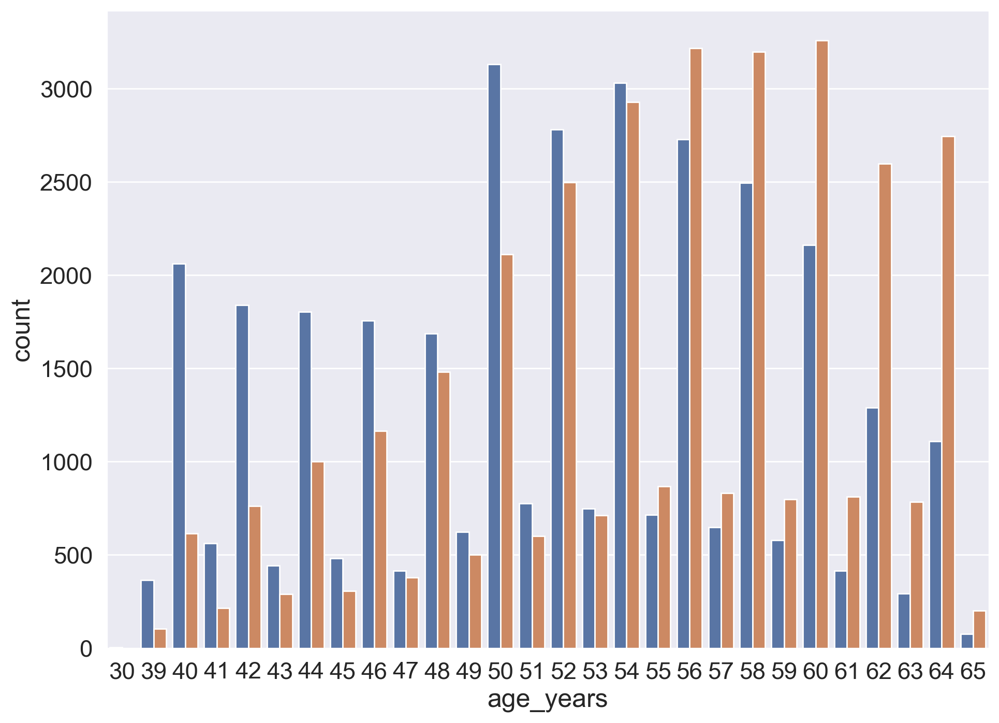

In [210]:
sns.countplot(data=filtered_df, x='age_years', hue='cardio')
plt.legend(title='Cardio Status', labels=['No Cardio', 'Has Cardio'])
plt.show()